In [ ]:
#Initiate the class instances
import os
import car_class as c
import environment_class as e
import proof_of_location as p
import pandas as pd
import initialiser_functions as i


def parser(simulation_number, coerced_cars, lying_cars, honest_cars, density, accuracy, True_Positive, True_Negative, False_Positive, False_Negative):
    #return list: ['Simulation number', 'Percent of coerced cars', 'Percent of lying cars', 'Percent of honest cars', 'Accuracy']
    total_cars = coerced_cars + lying_cars + honest_cars
    percent_coerced_cars = (coerced_cars / total_cars) * 100
    percent_lying_cars = (lying_cars / total_cars) * 100
    percent_honest_cars = (honest_cars / total_cars) * 100
    
    percent_true_positives = (True_Positive / total_cars) * 100
    percent_true_negatives = (True_Negative / total_cars ) * 100
    percent_false_positives = (False_Positive / total_cars) * 100
    percent_false_negatives = (False_Negative / total_cars) * 100

    row_list = [simulation_number, percent_coerced_cars, percent_lying_cars, percent_honest_cars, density, accuracy, 
    True_Positive, True_Negative, False_Positive, False_Negative, percent_true_positives, percent_true_negatives, 
    percent_false_positives, percent_false_negatives]

    return row_list

def check_interest_variable(var, list):
    '''Given an index for the variable of interest, it finds the absolute value for the variable of interest
    and returns a string, to use it as the filename of the simulation'''
    for index in range(len(list)):
        
        if var == index:
            print('HERE', str(list[index]))
            return str(list[index])


def simulation_generator(number_of_simulations:int, Number_of_coerced_cars:int, Number_of_lying_cars:int, Number_of_honest_cars:int, interest_variable:int, variable_list:list):
    """Simulation generator that takes number of simulations to perform, the three relevant variables. 
    interest_variable the index corresponding to the variable you want to pick from the variable_list"""

    data = []
    
    for simulation in range(number_of_simulations):
        cars = []
        cars = i.car_list_generator(Number_of_honest_cars, Number_of_lying_cars, Number_of_coerced_cars)
        
        total_cars = len(cars)
        

        London = e.Environment([0,2], [0,2], 0.25)
        e.environment_update(cars, 0.1, London)
        
        density = (London.width * London.height) / total_cars

        #Load the PoL algoritm and feed it the initialised objects
        Accuracy, DAG, True_Positive, True_Negative, False_Positive, False_Negative = p.PoL(cars)

        row = parser(simulation, Number_of_coerced_cars, Number_of_lying_cars, Number_of_honest_cars, density, Accuracy, True_Positive, True_Negative, False_Positive, False_Negative)
        print(row)
        data.append(row)
        print(data)
    df = pd.DataFrame(data, columns=['Simulation number', 'Percent of coerced cars', 'Percent of lying cars', 'Percent of honest cars', 'Density', 'Accuracy', 
    'True Positives', 'True Negatives', 'False Positives', 'False Negatives', 
    'Percent True Positives', 'Percent True Negatives', 'Percent False Positives','Percent False Negatives'])
    
    filename = check_interest_variable(interest_variable, variable_list)
    print(filename)
    headers = df.columns.tolist()
    cwd = os.getcwd()
    
    #interest_variable is an index, and to match it to the correct header title we add one, since the headers list starts
    #with 'Simulation number' as its first element
    path = cwd + '/' +  headers[interest_variable+1] + '/'
    os.makedirs(path, exist_ok =True)
    df.to_csv(path + filename + '.txt')
    print(df)
    return path + filename + '.txt', total_cars


#for val in range(int(variable_list[interest_variable]/2), variable_list[interest_variable]+50, 50):

In [6]:

f = open("honest_cars_simulation_pathfiles.txt", "w+")
for val in range(300, 800, 100):
    #print(val)
    Number_of_honest_cars=val
    Number_of_lying_cars = 100
    Number_of_coerced_cars = 200
    number_of_simulations = 100
    interest_variable = 2
    variable_list = [Number_of_coerced_cars, Number_of_lying_cars, Number_of_honest_cars]
    
    
    sim_pathfile, totalCars= simulation_generator(number_of_simulations, Number_of_coerced_cars, Number_of_lying_cars, Number_of_honest_cars, interest_variable, variable_list)
    print(sim_pathfile)
    f=open("honest_cars_simulation_pathfiles.txt", "a+")
    f.write(sim_pathfile+'\n')
    f.close()



[0, 33.33333333333333, 16.666666666666664, 50.0, 0.10666666666666667, 56.166666666666664, 237, 100, 0, 263, 39.5, 16.666666666666664, 0.0, 43.833333333333336]
[[0, 33.33333333333333, 16.666666666666664, 50.0, 0.10666666666666667, 56.166666666666664, 237, 100, 0, 263, 39.5, 16.666666666666664, 0.0, 43.833333333333336]]
[1, 33.33333333333333, 16.666666666666664, 50.0, 0.10666666666666667, 59.833333333333336, 260, 99, 1, 240, 43.333333333333336, 16.5, 0.16666666666666669, 40.0]
[[0, 33.33333333333333, 16.666666666666664, 50.0, 0.10666666666666667, 56.166666666666664, 237, 100, 0, 263, 39.5, 16.666666666666664, 0.0, 43.833333333333336], [1, 33.33333333333333, 16.666666666666664, 50.0, 0.10666666666666667, 59.833333333333336, 260, 99, 1, 240, 43.333333333333336, 16.5, 0.16666666666666669, 40.0]]
[2, 33.33333333333333, 16.666666666666664, 50.0, 0.10666666666666667, 58.166666666666664, 249, 100, 0, 251, 41.5, 16.666666666666664, 0.0, 41.833333333333336]
[[0, 33.33333333333333, 16.666666666666

In [9]:

f = open("lying_cars_simulation_pathfiles.txt", "w+")
for val in range(300, 800, 100):
    #print(val)
    Number_of_honest_cars = 200
    Number_of_lying_cars = val
    Number_of_coerced_cars = 100
    number_of_simulations = 100
    interest_variable = 1
    variable_list = [Number_of_coerced_cars, Number_of_lying_cars, Number_of_honest_cars]
    
    
    sim_pathfile, totalCars= simulation_generator(number_of_simulations, Number_of_coerced_cars, Number_of_lying_cars, Number_of_honest_cars, interest_variable, variable_list)
    print(sim_pathfile)
    f=open("lying_cars_simulation_pathfiles.txt", "a+")
    f.write(sim_pathfile+'\n')
    f.close()

[0, 16.666666666666664, 50.0, 33.33333333333333, 0.10666666666666667, 52.666666666666664, 16, 300, 0, 284, 2.666666666666667, 50.0, 0.0, 47.333333333333336]
[[0, 16.666666666666664, 50.0, 33.33333333333333, 0.10666666666666667, 52.666666666666664, 16, 300, 0, 284, 2.666666666666667, 50.0, 0.0, 47.333333333333336]]
[1, 16.666666666666664, 50.0, 33.33333333333333, 0.10666666666666667, 53.833333333333336, 23, 300, 0, 277, 3.833333333333333, 50.0, 0.0, 46.166666666666664]
[[0, 16.666666666666664, 50.0, 33.33333333333333, 0.10666666666666667, 52.666666666666664, 16, 300, 0, 284, 2.666666666666667, 50.0, 0.0, 47.333333333333336], [1, 16.666666666666664, 50.0, 33.33333333333333, 0.10666666666666667, 53.833333333333336, 23, 300, 0, 277, 3.833333333333333, 50.0, 0.0, 46.166666666666664]]
[2, 16.666666666666664, 50.0, 33.33333333333333, 0.10666666666666667, 53.166666666666664, 19, 300, 0, 281, 3.166666666666667, 50.0, 0.0, 46.833333333333336]
[[0, 16.666666666666664, 50.0, 33.33333333333333, 0.1

In [10]:
f = open("coerced_cars_simulation_pathfiles.txt", "w+")
for val in range(300, 800, 100):
    #print(val)
    Number_of_honest_cars = 200
    Number_of_lying_cars = 100
    Number_of_coerced_cars = val
    number_of_simulations = 100
    interest_variable = 0
    variable_list = [Number_of_coerced_cars, Number_of_lying_cars, Number_of_honest_cars]
    
    
    sim_pathfile, totalCars= simulation_generator(number_of_simulations, Number_of_coerced_cars, Number_of_lying_cars, Number_of_honest_cars, interest_variable, variable_list)
    print(sim_pathfile)
    f=open("coerced_cars_simulation_pathfiles.txt", "a+")
    f.write(sim_pathfile+'\n')
    f.close()

[0, 50.0, 16.666666666666664, 33.33333333333333, 0.10666666666666667, 59.0, 255, 99, 1, 245, 42.5, 16.5, 0.16666666666666669, 40.833333333333336]
[[0, 50.0, 16.666666666666664, 33.33333333333333, 0.10666666666666667, 59.0, 255, 99, 1, 245, 42.5, 16.5, 0.16666666666666669, 40.833333333333336]]
[1, 50.0, 16.666666666666664, 33.33333333333333, 0.10666666666666667, 58.166666666666664, 249, 100, 0, 251, 41.5, 16.666666666666664, 0.0, 41.833333333333336]
[[0, 50.0, 16.666666666666664, 33.33333333333333, 0.10666666666666667, 59.0, 255, 99, 1, 245, 42.5, 16.5, 0.16666666666666669, 40.833333333333336], [1, 50.0, 16.666666666666664, 33.33333333333333, 0.10666666666666667, 58.166666666666664, 249, 100, 0, 251, 41.5, 16.666666666666664, 0.0, 41.833333333333336]]
[2, 50.0, 16.666666666666664, 33.33333333333333, 0.10666666666666667, 58.333333333333336, 253, 97, 3, 247, 42.16666666666667, 16.166666666666664, 0.5, 41.16666666666667]
[[0, 50.0, 16.666666666666664, 33.33333333333333, 0.10666666666666667

In [ ]:
#Load the PoL algoritm and feed it the initialised objects

#return list: ['Simulation number', 'Percent of coerced cars', 'Percent of lying cars', 'Percent of honest cars', 'Accuracy']

    Unnamed: 0  Simulation number  Percent of coerced cars  \
0            0                  0                33.333333   
1            1                  1                33.333333   
2            2                  2                33.333333   
3            3                  3                33.333333   
4            4                  4                33.333333   
..         ...                ...                      ...   
95          95                 95                22.222222   
96          96                 96                22.222222   
97          97                 97                22.222222   
98          98                 98                22.222222   
99          99                 99                22.222222   

    Percent of lying cars  Percent of honest cars   Density   Accuracy  \
0               16.666667               50.000000  0.106667  56.166667   
1               16.666667               50.000000  0.106667  59.833333   
2               16.666667        

/var/folders/1c/d6dtqw7x0mv_fdygd5c2mggw0000gp/T/ipykernel_74424/3452949583.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data)
/var/folders/1c/d6dtqw7x0mv_fdygd5c2mggw0000gp/T/ipykernel_74424/3452949583.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data)
/var/folders/1c/d6dtqw7x0mv_fdygd5c2mggw0000gp/T/ipykernel_74424/3452949583.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data)
/var/folders/1c/d6dtqw7x0mv_fdygd5c2mggw0000gp/T/ipykernel_74424/3452949583.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data)
/var/folders/1c/d6dtqw7x0mv_fdygd5c2mggw0000

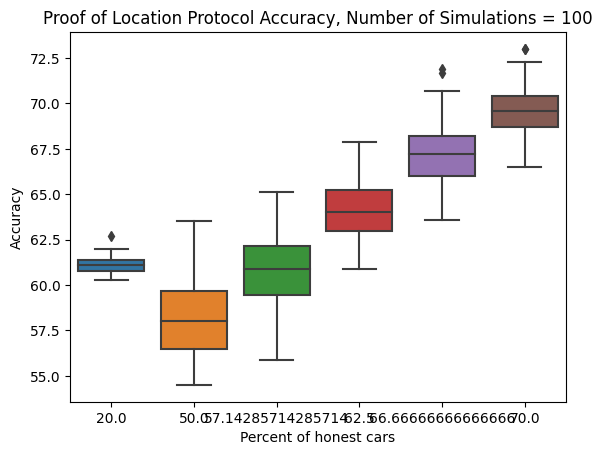

In [24]:
import visualisation_functions as v
directory_path_string = '/Users/amm3117/Desktop/Proof-of-Location/Proof-of-Location/Percent of honest cars/'


directory = os.fsencode(directory_path_string)
df = pd.DataFrame()

for file in os.listdir(directory):
    filename = os.fsdecode(file)
    
    if filename.endswith('.txt'):
        simulation_path = directory_path_string + filename
        #print('HERE! ',simulation_path)
        data = pd.read_csv(simulation_path)
        df = df.append(data)

print(df)
df.to_csv(directory_path_string+'full_data.csv')

v.simulation_box_plots(100, directory_path_string+'full_data.csv', 'Percent of honest cars', 'Accuracy')

In [ ]:
v.simulation_violin_plots(100, directory_path_string+'full_data.csv', 'Percent of honest cars', 'Accuracy')


In [ ]:
v.simulation_box_plots(100, directory_path_string+'full_data.csv', 'Percent of honest cars', 'Density')